# Project

## Import statements + Device

In [1]:
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torchvision import datasets
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
from utils import print_np_array_properties, imshow_batch, imshow_with_encoded_labels, encode_attrs, get_encoded_attrs, split_data
from tqdm.notebook import tqdm, trange
import warnings
import logging
import time, datetime
str_format = '%Y%m%d%H%M%S'
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)
warnings.filterwarnings("ignore")
%matplotlib inline
torch.cuda.empty_cache()


attr_dir = './data/CUB_200_2011/attributes.txt'
class_dir = 'data/CUB_200_2011/CUB_200_2011/classes.txt'

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Available Device: {device}')

Available Device: cuda


## Dataset

### Custom Dataset

In [2]:
class CUB_200_2011(datasets.ImageFolder):
    """Custom dataset that includes image paths. Extends
    torchvision.datasets.ImageFolder
    """
    
    def __init__(self, img_id_file = 'data/CUB_200_2011/CUB_200_2011/images.txt',
                       attrs_label_file = 'data/CUB_200_2011/CUB_200_2011/attributes/image_attribute_labels.txt',
                       encoded_concat=True,
                       *args, **kwargs):
        
        super().__init__(*args, **kwargs)
        
        self.encoded_concat=encoded_concat

        attr_set = dict()

        with open(attrs_label_file) as file:

            for idx, line in enumerate(file):
                img_id, attr_id= line.split(' ')[0], line.split(' ')[1]
                attr_value = 1 if int(line.split(' ')[2]) ==1 and int(line.split(' ')[3]) >= 3 else 0
                if img_id not in attr_set:
                    attr_set[img_id]= [attr_value]       
                else:
                    attr_set[img_id].append(attr_value)
                    
        x = [encoding for key, encoding in attr_set.items()] 
        
        self.encoded_attrs = torch.tensor(x)
        
        img_id_dict = dict()
        with open(img_id_file) as file:
            for line in file:
                line=line.rstrip()
                img_id, img_label= line.split(' ')[0], line.split('/')[1]
                img_id_dict[img_label]= img_id
                
        self.img_id_dict = img_id_dict

    # override the __getitem__ method that dataloader calls
    def __getitem__(self, index):
        
        path, target = self.imgs[index]
        img = self.loader(path)
        img_label = path.split('/')[-1]
        img_id = self.img_id_dict[img_label]
        img_idx = int(img_id)-1
        
        attrs = self.encoded_attrs[img_idx]
        
        encoded_class = torch.zeros(200)
        encoded_class[target] = 1
        
        if self.transform is not None:
            img = self.transform(img)
        if self.target_transform is not None:
            target = self.target_transform(target)
            
        if self.encoded_concat:
            encoded_target = torch.cat((encoded_class, attrs), dim=0)
            
            return img, encoded_target
        
        else:
            return img, target, encoded_class, attrs
            
    
    def __len__(self):
        return len(self.imgs)


### Download Dataset

Training data size: 9430
Validation data size: 1179
testing data size: 1179
=============== np array Properties =============

np array:
 tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

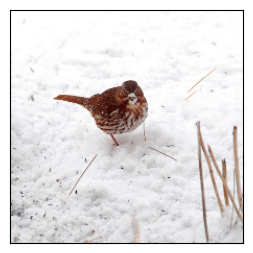

In [3]:
num_workers = 0
# how many samples per batch to load
batch_size = 7

with open(attr_dir) as file:
    attr_labels  = [line.rstrip().split(' ')[1] for line in file]    

with open(class_dir) as file:
    class_labels = [line.rstrip().split(' ')[1] for line in file]
    

combined_target_labels = class_labels + attr_labels

# print(len(combined_target_labels))


## Define preprocessing transformation applied to data
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224,224)), #scale images to 224x224
    # transforms.Normalize(
    #     mean=[0.485, 0.456, 0.406],  # mean values for ImageNet
    #     std=[0.229, 0.224, 0.225]  # standard deviation values for ImageNet
    # )
    ])


data = CUB_200_2011(
    root='./data/CUB_200_2011/CUB_200_2011/images/',
    transform = transform,
    encoded_concat=True
)


train_data, valid_data, test_data= split_data(data)

print(f'Training data size: {len(train_data)}')
print(f'Validation data size: {len(valid_data)}')
print(f'testing data size: {len(test_data)}')


train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)

# print(f'\nclass labels:\n {class_labels}') 
# print(f'\nattribute labels:\n {attr_labels}') 

    
dataiter = iter(train_loader)
images, encoded_targets = next(dataiter)

print_np_array_properties(encoded_targets[0])
first_img_targets = get_encoded_attrs(combined_target_labels,encoded_targets[0])
print(first_img_targets)
imshow_batch(1, images)

# imshow_with_encoded_labels(1, images, attrs, attr_labels)



## Conditional Variational Autoencoder Architecture

In [4]:
class CVAE(nn.Module):
    def __init__(self, latent_size = 256, num_classes = 512, frame_size=(224,224)):
        
        super(CVAE, self).__init__()
        
        self.mu=None
        self.logvar=None
        self.latent_size = latent_size
        self.num_classes = num_classes
        self.frame_height, self.width = frame_size
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3 + self.num_classes, 64, kernel_size=3, padding=1),
            # nn.BatchNorm2d(16),
            nn.ReLU(),
            
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            # nn.BatchNorm2d(8),
            nn.ReLU(),
            
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        self.mu_fc = nn.Linear(32*56*56, self.latent_size)
        
        self.logvar_fc = nn.Linear(32*56*56, self.latent_size)
        
        self.z_fc = nn.Linear(self.latent_size + self.num_classes, 32*56*56) 
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 64, kernel_size=2, stride=2),
            # nn.BatchNorm2d(16),
            nn.ReLU(),
            
            nn.ConvTranspose2d(64, 3, kernel_size=2, stride=2),
            nn.Sigmoid()
        )
        
    def encode(self, x, y):
        y = y.reshape(y.shape[0], self.num_classes, 1, 1).repeat(1, 1, self.frame_height, self.width)
        
        x = torch.cat([x,y], dim=1)
        x = self.encoder(x)
        x = x.view(x.size(0), -1)        
        mu = self.mu_fc(x)
        logvar = self.logvar_fc(x)
        
        return mu, logvar

    def reparam(self, mu, logvar):
        
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        
        z = mu + eps * std
        return z
    
    
    def decode(self, z, y):
        # y = y.reshape(y.shape[0], self.num_classes, 1, 1).repeat(1, 1, 54, 44)
        # print_np_array_properties(y)
        
        z = torch.cat([z, y.view(y.size(0),-1)], dim=1)
        # print_np_array_properties(z)
        
        z = self.z_fc(z)
        
        z = z.view(z.size(0), 32, 56, 56)
        
        x = self.decoder(z)
        
        return x
            
    def forward(self, x, y):
        
        self.mu, self.logvar = self.encode(x,y)
        z = self.reparam(self.mu, self.logvar)
        x = self.decode(z, y)
        # x = torch.clamp(x, min=1e-7, max=1-1e-7)
        
        return x, self.mu, self.logvar

# def cvae_loss(x_out, x, mu, logvar, beta=.5):
    
#     BCE = F.binary_cross_entropy(x_out, x, reduction='sum')
#     KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
#     return (1-beta)*BCE + beta*KLD

def cvae_loss(x_out, x, mu, logvar, beta=0.5):
    # Reconstruction loss (Mean Squared Error)
    mse_loss = nn.MSELoss(reduction='sum')
    recon_loss = mse_loss(x_out, x)

    # KL-divergence loss
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return (1-beta)*recon_loss + beta*kl_loss, recon_loss, kl_loss

def initialize_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear)):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)

In [5]:
model = CVAE().to(device)
model.apply(initialize_weights)

print(model)

# print_np_array_properties(images)

x, mu, logvar = model(images.to(device), encoded_targets.to(device))


print_np_array_properties(x, 'reconstructed x')
print_np_array_properties(mu, 'mu')
print_np_array_properties(logvar, 'logvar')


loss_func = cvae_loss
optimizer = optim.Adam(model.parameters(), lr=1e-4)

CVAE(
  (encoder): Sequential(
    (0): Conv2d(515, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (mu_fc): Linear(in_features=100352, out_features=256, bias=True)
  (logvar_fc): Linear(in_features=100352, out_features=256, bias=True)
  (z_fc): Linear(in_features=768, out_features=100352, bias=True)
  (decoder): Sequential(
    (0): ConvTranspose2d(32, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(64, 3, kernel_size=(2, 2), stride=(2, 2))
    (3): Sigmoid()
  )
)
=============== reconstructed x Properties =============

reconstructed x:
 tensor([[[[0.4272, 0.2422, 0.3540,  ..., 0.6601, 0.5210, 0.3734],
          [0.6589, 0.6955, 0.7595,  ..., 0.4903, 0.7960, 0.6427],
 

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/1348 [00:00<?, ?it/s]

  0%|          | 0/169 [00:00<?, ?it/s]

Epoch: 1 	Training Loss: 5666.156250 	Training recon Loss: 12080.206268 	Training kl Loss: 4953.484107 	Validation Loss: 5671.241231 	Validation recpm Loss: 12100.543419 	Validation kl Loss: 4956.874400
Validation loss decreased (inf --> 5671.241231).  Saving model ...


  0%|          | 0/1348 [00:00<?, ?it/s]

  0%|          | 0/169 [00:00<?, ?it/s]

Epoch: 2 	Training Loss: 5665.918674 	Training recon Loss: 12078.628060 	Training kl Loss: 4953.395490 	Validation Loss: 5670.473503 	Validation recpm Loss: 12093.306651 	Validation kl Loss: 4956.825448
Validation loss decreased (5671.241231 --> 5670.473503).  Saving model ...


  0%|          | 0/1348 [00:00<?, ?it/s]

  0%|          | 0/169 [00:00<?, ?it/s]

Epoch: 3 	Training Loss: 5665.794330 	Training recon Loss: 12077.120199 	Training kl Loss: 4953.424869 	Validation Loss: 5670.740327 	Validation recpm Loss: 12101.663818 	Validation kl Loss: 4956.193355


  0%|          | 0/1348 [00:00<?, ?it/s]

  0%|          | 0/169 [00:00<?, ?it/s]

Epoch: 4 	Training Loss: 5666.023270 	Training recon Loss: 12079.157663 	Training kl Loss: 4953.452865 	Validation Loss: 5670.672893 	Validation recpm Loss: 12100.384036 	Validation kl Loss: 4956.260631


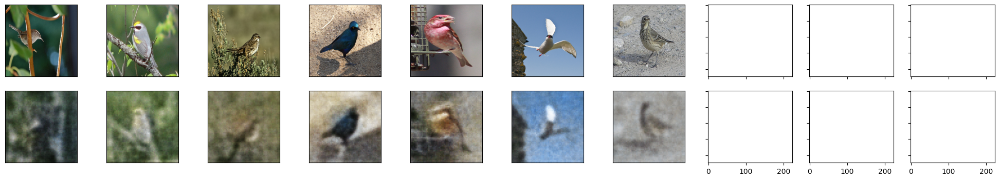

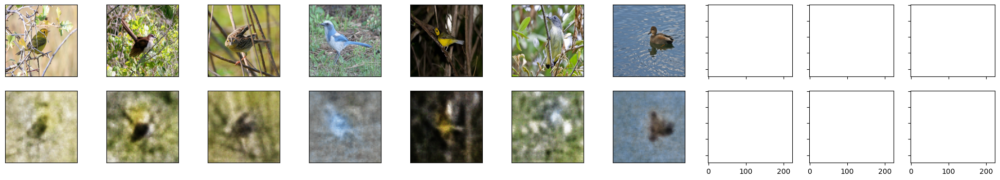

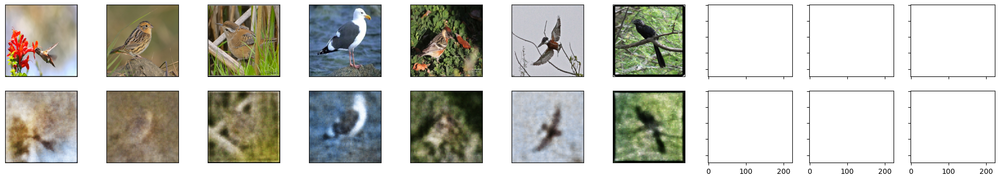

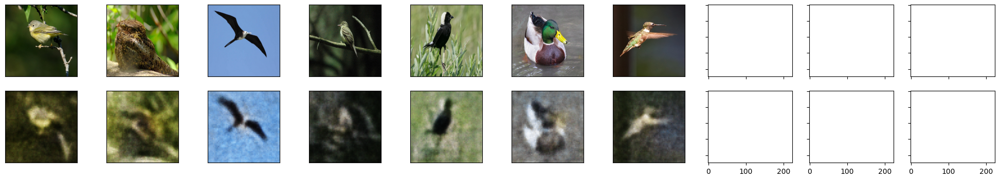

In [14]:
n_epochs=4
ts = datetime.datetime.now().strftime(str_format)
beta = 0.9 # This is used as a weight for loss function (focuses on reconstruction)0>beta>1(focuses on KLD)

valid_loss_min = np.Inf

for epoch in trange(1, n_epochs+1):
    
    train_loss=0.0
    train_recon_loss=0.0
    train_kl_loss=0.0
    
    valid_loss=0.0
    valid_recon_loss=0.0
    valid_kl_loss=0.0
    
    
    ## Training Step
    model.train()
    for images, labels in tqdm(train_loader):
        
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad() # clar the gradients of all optimized variables
        x_out, mu, logvar = model(images, labels) # Forward pass
        
        # print("Output tensor:", x_out)
        # print("Output tensor min value:", x_out.min().item())
        # print("Output tensor max value:", x_out.max().item())
        # print("Target tensor:", images)
        # print("Target tensor min value:", images.min().item())
        # print("Target tensor max value:", images.max().item())
        
        loss, recon_loss, kl_loss = loss_func(x_out, images, mu, logvar, beta=beta) # calculate loss of the forward pass
        
        loss.backward() #calculate gradients based on the loss
        
        optimizer.step() # update weights
        
        train_loss += loss.item()*images.size(0)
        train_recon_loss += recon_loss.item()*images.size(0)
        train_kl_loss += kl_loss.item()*images.size(0)
        
    ## Validation Step
    
    model.eval()
    for images, labels in tqdm(valid_loader):
        images, labels = images.to(device), labels.to(device)
        
        x_out, mu, logvar = model(images, labels) # forward pass
        
        loss, recon_loss, kl_loss = loss_func(x_out, images, mu, logvar, beta=beta)
        
        valid_loss += loss.item() * images.size(0)
        valid_recon_loss += recon_loss.item() * images.size(0)
        valid_kl_loss += kl_loss.item() * images.size(0)
    
    # calculate Average loss
    train_loss = train_loss/len(train_loader.dataset)
    train_recon_loss = train_recon_loss/len(train_loader.dataset)
    train_kl_loss = train_kl_loss/len(train_loader.dataset)
    
    valid_loss = valid_loss/len(valid_loader.dataset)
    valid_recon_loss = valid_recon_loss/len(valid_loader.dataset)
    valid_kl_loss = valid_kl_loss/len(valid_loader.dataset)
    
    #Print progress statement
    print('Epoch: {} \tTraining Loss: {:.6f} \tTraining recon Loss: {:.6f} \tTraining kl Loss: {:.6f} \tValidation Loss: {:.6f} \tValidation recpm Loss: {:.6f} \tValidation kl Loss: {:.6f}'.format(epoch, train_loss,train_recon_loss,train_kl_loss, valid_loss, valid_recon_loss, valid_kl_loss))
    
    # print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch, train_loss, valid_loss))
    
    #Test after ach epoch
    # obtain one batch of test images
    dataiter = iter(test_loader)
    images, labels = next(dataiter)
    view_size = 10 if batch_size >=10 else batch_size
    images = images[:view_size]
    labels = labels[:view_size]

    # get sample outputs
    output, _, _ = model(images.to(device), labels.to(device))
    # prep images for display
    images = images.numpy()

    # output is resized into a batch of iages
    output = output.to('cpu').view(view_size, 3, 224, 224)
    # use detach when it's an output that requires_grad
    output = output.detach().numpy()

    # plot the first ten input images and then reconstructed images
    fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(25,4))

    # input images on top row, reconstructions on bottom
    for images, row in zip([images, output], axes):
        for img, ax in zip(images, row):
            ax.imshow(np.transpose(img, (1,2,0)))
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
    
    
    #Save model with the lowest validation loss
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))
        torch.save(model.state_dict(), f'./data/CVAE_birds_{ts}.pt')
        valid_loss_min = valid_loss

=============== latent code Properties =============

latent code:
 tensor([[ 0.9204,  2.1018, -1.8311,  ...,  0.3184, -0.3901, -0.3254],
        [ 1.0069, -1.1399,  1.5987,  ...,  0.9711,  0.8732,  0.0394],
        [-2.5312,  0.6721,  0.2923,  ...,  0.7079, -1.2573,  0.4860],
        ...,
        [ 1.9536,  2.2067, -1.9855,  ...,  0.0371,  0.5016, -0.9974],
        [ 0.5770, -0.1760,  0.6518,  ...,  0.9320, -1.4779, -0.2326],
        [-0.2908,  0.3194, -1.6849,  ..., -0.5102,  0.6538, -0.1812]],
       device='cuda:0')
latent code_dtype: torch.float32
latent code_shape: torch.Size([50, 256])
latent code_size: <built-in method size of Tensor object at 0x7f7c9015bba0>

Attributes to reproduce:
['039.Least_Flycatcher', 'has_bill_shape::all-purpose', 'has_wing_color::iridescent', 'has_upperparts_color::green', 'has_underparts_color::green', 'has_breast_pattern::multi-colored', 'has_back_color::green', 'has_tail_shape::pointed_tail', 'has_upper_tail_color::green', 'has_head_pattern::eyebro

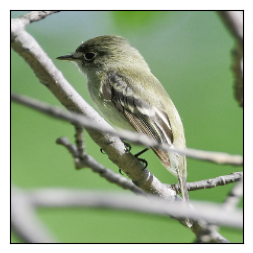

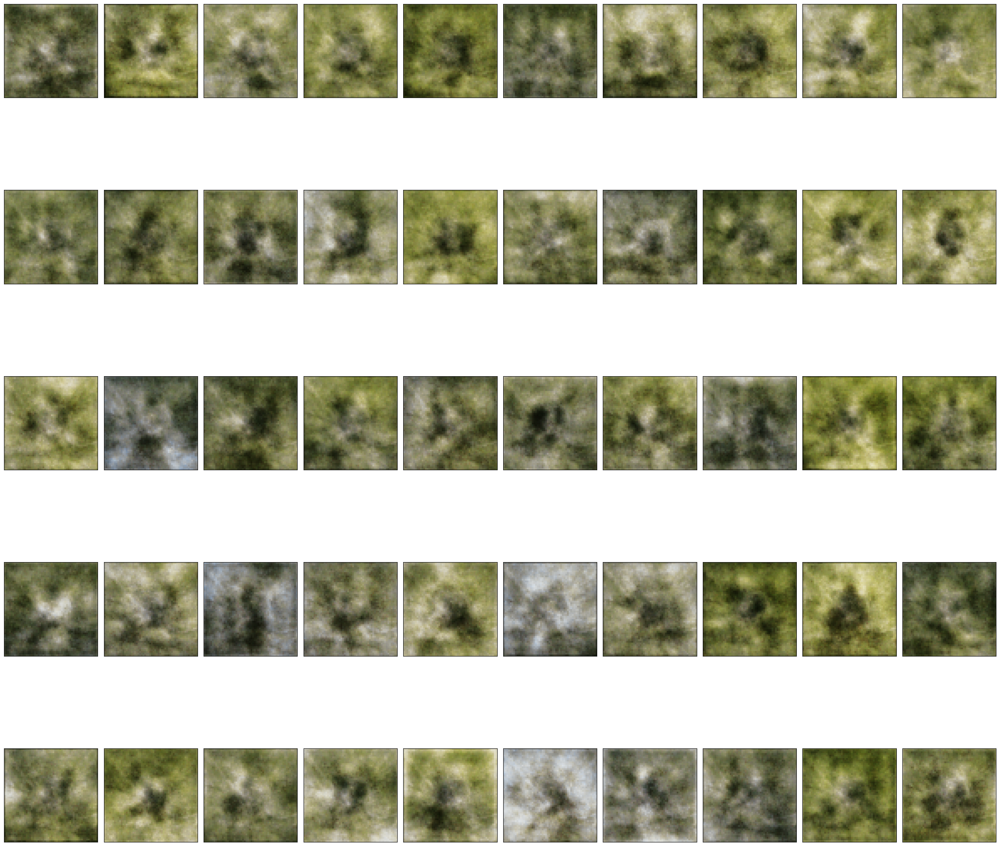

In [7]:
model = CVAE().to(device)
model.load_state_dict(torch.load('./data/CVAE_birds_20230411215929_MSE_90percent.pt'))
        
group_size = 50
latent_size = model.latent_size 

z = torch.randn(group_size, latent_size).to(device)

print_np_array_properties(z, name='latent code')

dataiter = iter(test_loader)
images, encoded_targets = next(dataiter)


label=encoded_targets[0]
first_img_targets = get_encoded_attrs(combined_target_labels,label)
print(f'Attributes to reproduce:\n{first_img_targets}')
imshow_batch(1, images)

label_batch = label.reshape(1, model.num_classes).repeat(group_size, 1)

# generate an image from the random latent vector using the decoder
model.eval()
with torch.no_grad():
    output = model.decode(z, label_batch.to(device))
    
output = output.to('cpu')

imshow_batch(group_size, output)


#### This cell is just to display list of attributes

In [26]:
print(combined_target_labels)

['001.Black_footed_Albatross', '002.Laysan_Albatross', '003.Sooty_Albatross', '004.Groove_billed_Ani', '005.Crested_Auklet', '006.Least_Auklet', '007.Parakeet_Auklet', '008.Rhinoceros_Auklet', '009.Brewer_Blackbird', '010.Red_winged_Blackbird', '011.Rusty_Blackbird', '012.Yellow_headed_Blackbird', '013.Bobolink', '014.Indigo_Bunting', '015.Lazuli_Bunting', '016.Painted_Bunting', '017.Cardinal', '018.Spotted_Catbird', '019.Gray_Catbird', '020.Yellow_breasted_Chat', '021.Eastern_Towhee', '022.Chuck_will_Widow', '023.Brandt_Cormorant', '024.Red_faced_Cormorant', '025.Pelagic_Cormorant', '026.Bronzed_Cowbird', '027.Shiny_Cowbird', '028.Brown_Creeper', '029.American_Crow', '030.Fish_Crow', '031.Black_billed_Cuckoo', '032.Mangrove_Cuckoo', '033.Yellow_billed_Cuckoo', '034.Gray_crowned_Rosy_Finch', '035.Purple_Finch', '036.Northern_Flicker', '037.Acadian_Flycatcher', '038.Great_Crested_Flycatcher', '039.Least_Flycatcher', '040.Olive_sided_Flycatcher', '041.Scissor_tailed_Flycatcher', '042.Ver

### Custom Sampling

=============== latent code Properties =============

latent code:
 tensor([[ 1.2021,  0.1057,  0.1807,  ...,  1.1254,  0.3048,  0.7939],
        [-0.7485, -0.6669,  0.3445,  ..., -0.3029,  0.7337, -0.0756],
        [ 0.1239, -3.2526, -0.3311,  ...,  0.5181,  0.4321,  0.1938],
        ...,
        [ 1.0899, -0.9933, -1.0989,  ...,  2.1046,  0.3312, -1.5048],
        [ 2.1119,  0.9946, -0.3774,  ...,  0.1855, -1.8272,  1.1377],
        [-0.1192, -0.8402,  0.0537,  ..., -1.2858, -2.1290,  1.4847]],
       device='cuda:0')
latent code_dtype: torch.float32
latent code_shape: torch.Size([50, 256])
latent code_size: <built-in method size of Tensor object at 0x7fd0a80d4ef0>

Attributes to reproduce:
['167.Hooded_Warbler', 'has_bill_shape::all-purpose', 'has_wing_color::yellow', 'has_upperparts_color::yellow', 'has_underparts_color::yellow', 'has_breast_pattern::solid', 'has_back_color::yellow', 'has_tail_shape::rounded_tail', 'has_head_pattern::plain', 'has_breast_color::yellow', 'has_throat_

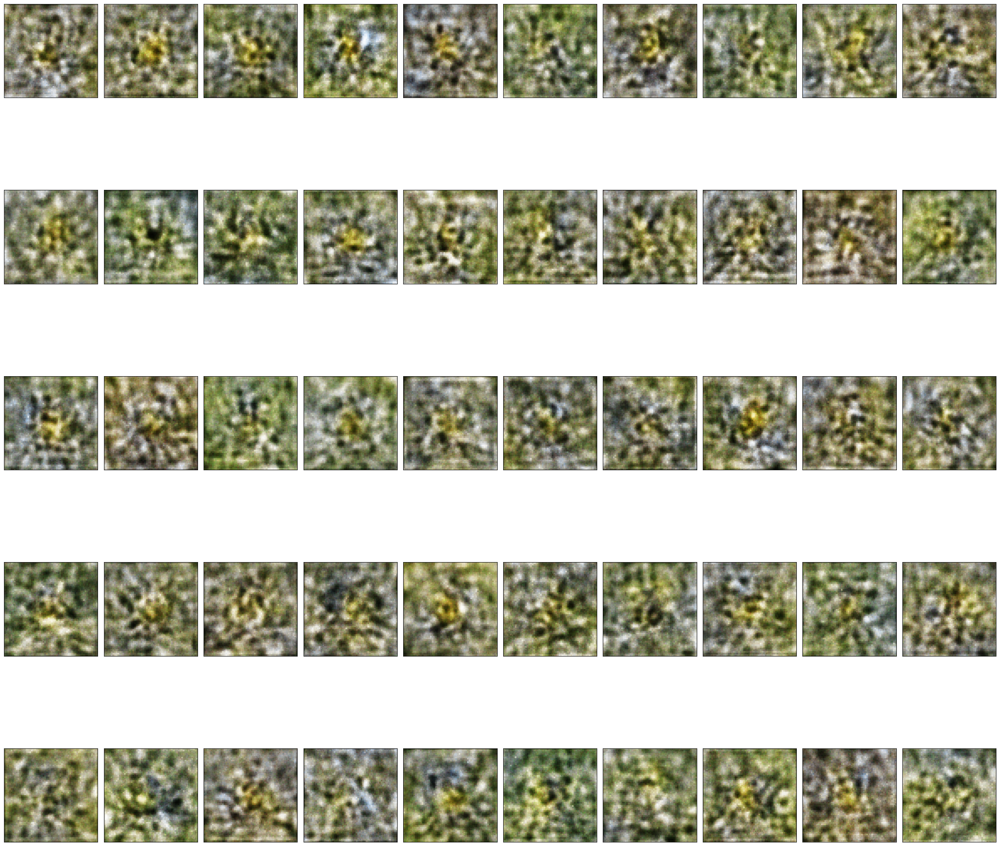

In [13]:
model = CVAE().to(device)
# model.load_state_dict(torch.load('./data/CVAE_birds_20230411215929_MSE_90percent.pt'))
# model.load_state_dict(torch.load('./data/CVAE_birds_20230411094617_75percent.pt'))
# model.load_state_dict(torch.load('./data/CVAE_birds_20230410091544_lr1e4_256.pt'))
model.load_state_dict(torch.load('./data/CVAE_birds_20230411074848_.25percent.pt'))


group_size = 50
latent_size = model.latent_size 

z = torch.randn(group_size, latent_size).to(device)

print_np_array_properties(z, name='latent code')


custom_attrs = ['167.Hooded_Warbler', 'has_bill_shape::all-purpose', 'has_wing_color::yellow', 'has_upperparts_color::yellow', 
                'has_underparts_color::yellow', 'has_breast_pattern::solid', 'has_back_color::yellow', 'has_tail_shape::rounded_tail',
                'has_head_pattern::plain', 'has_breast_color::yellow', 'has_throat_color::yellow', 'has_eye_color::black', 'has_bill_length::shorter_than_head',
                'has_forehead_color::buff', 'has_nape_color::buff', 'has_belly_color::yellow', 'has_size::very_small_(3_-_5_in)', 'has_shape::perching-like',
                'has_back_pattern::solid', 'has_belly_pattern::solid', 'has_primary_color::yellow',
                'has_leg_color::white', 'has_bill_color::yellow', 'has_bill_color::black',
                'has_crown_color::buff', 'has_wing_pattern::solid']


print(f'Attributes to reproduce:\n{custom_attrs}')


custom_label = torch.tensor(encode_attrs(custom_attrs, combined_target_labels))

custom_label_batch = custom_label.reshape(1, model.num_classes).repeat(group_size, 1)

# generate an image from the random latent vector using the decoder
model.eval()
with torch.no_grad():
    custom_output = model.decode(z, custom_label_batch.to(device))
    
custom_output = custom_output.to('cpu')

imshow_batch(group_size, custom_output)
